## Gaussian KL curve

In [ ]:
from umap import UMAP
import numpy as np
from metrics import Metrics
from pathlib import Path
from tqdm.notebook import tqdm
from multiprocessing import Pool, cpu_count
import matplotlib.pyplot as plt

DATASET_DIR = Path('datasets')
dataset = "coil20"

scales = np.linspace(0, 3, 350)
X = np.load(DATASET_DIR / f"{dataset}.npy")

### Figure

In [ ]:
Y = UMAP(random_state=100, n_jobs=1).fit_transform(X)

# globals inside workers
_X = None
_Y = None

def init_worker(X, Y):
    global _X, _Y
    _X = X
    _Y = Y

def compute_kl(alpha):
    M = Metrics(_X, _Y * alpha, setbatch=False)
    return M.compute_kl_divergence(perplexity=30, y_similarity='normal')

with Pool(
    processes=cpu_count(),
    initializer=init_worker,
    initargs=(X, Y),
) as pool:
    kl_values = list(tqdm(
        pool.imap(compute_kl, scales),
        total=len(scales)
    ))

  0%|          | 0/350 [00:00<?, ?it/s]

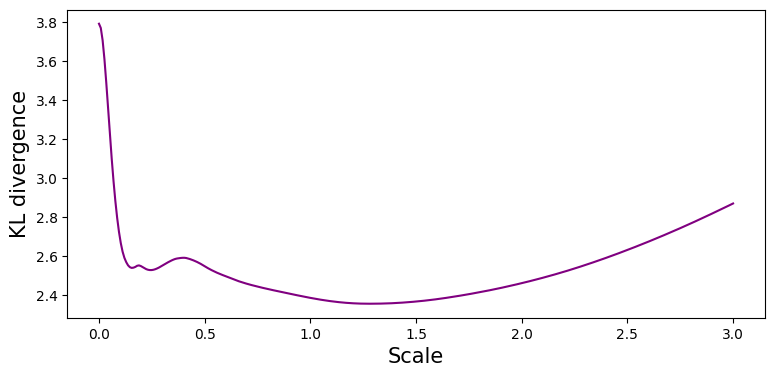

In [ ]:
fig, ax = plt.subplots(figsize=(9,4))

ax.plot(scales, kl_values, c='purple')
ax.set_xlabel("Scale", size=15)
ax.set_ylabel("KL divergence", size=15)

plt.show()
fig.savefig("figs/gaussian_kl.pdf")

### Multiple examples

  0%|          | 0/300 [00:00<?, ?it/s]

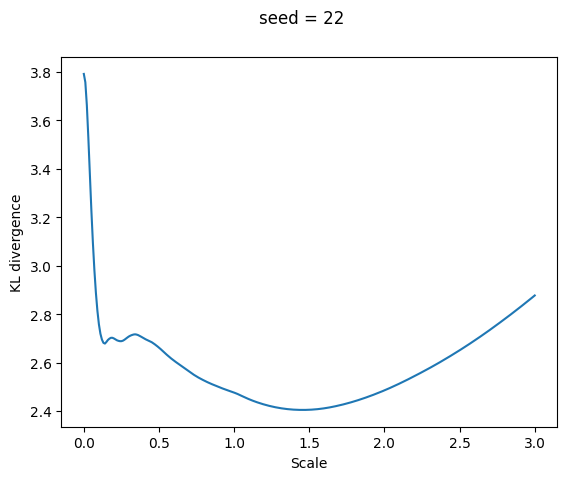

  0%|          | 0/300 [00:00<?, ?it/s]

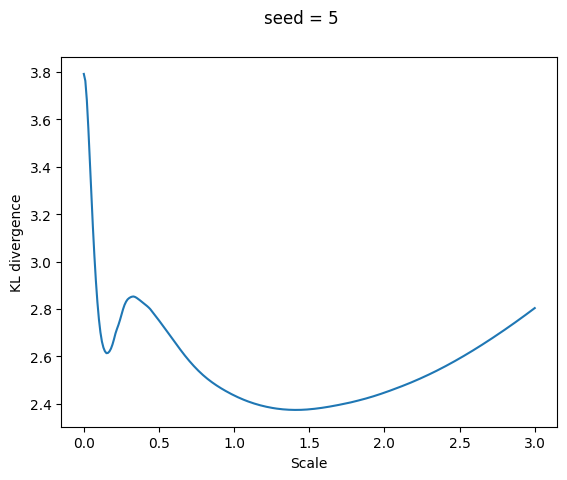

  0%|          | 0/300 [00:00<?, ?it/s]

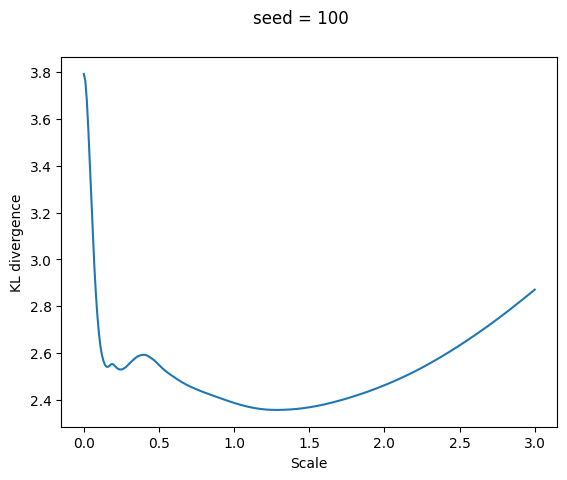

In [ ]:
for seed in [22,5,100]:
    Y = UMAP(random_state=seed, n_jobs=1).fit_transform(X)

    # globals inside workers
    _X = None
    _Y = None

    def init_worker(X, Y):
        global _X, _Y
        _X = X
        _Y = Y

    def compute_kl(alpha):
        M = Metrics(_X, _Y * alpha, setbatch=False)
        return M.compute_kl_divergence(perplexity=30, y_similarity='normal')

    with Pool(
        processes=cpu_count(),
        initializer=init_worker,
        initargs=(X, Y),
    ) as pool:
        kl_values = list(tqdm(
            pool.imap(compute_kl, scales),
            total=len(scales)
        ))

    fig, ax = plt.subplots()

    ax.plot(scales, kl_values)
    ax.set_xlabel("Scale")
    ax.set_ylabel("KL divergence")
    fig.suptitle(f"seed = {seed}")
    plt.show()

#### All datasets

In [ ]:
datasets = ['iris',
 'wine',
 'penguins',
 'auto-mpg',
 'orl',
 'seismic',
 'svhn',
 'har',
 'sms',
 'fmd',
 'cnae9',
 'coil20',
#  's-curve',
#  'swissroll',
#  'secom',
#  'bank',
#  'sentiment',
#  'fashion_mnist',
#  'hiva',
#  'hatespeech',
#  'cifar10',
#  'imdb',
#  'spambase',
#  'epileptic'
 ]

100%|██████████| 100/100 [00:00<00:00, 167.79it/s]


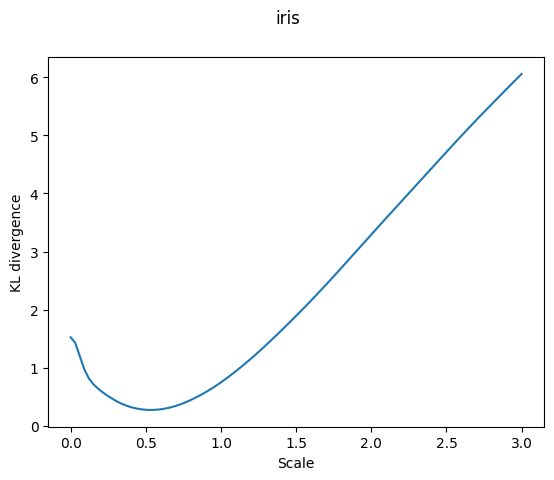

100%|██████████| 100/100 [00:01<00:00, 64.36it/s]


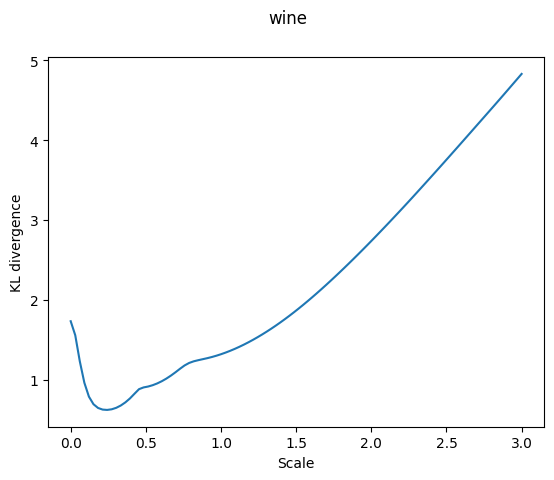

100%|██████████| 100/100 [00:07<00:00, 13.17it/s]


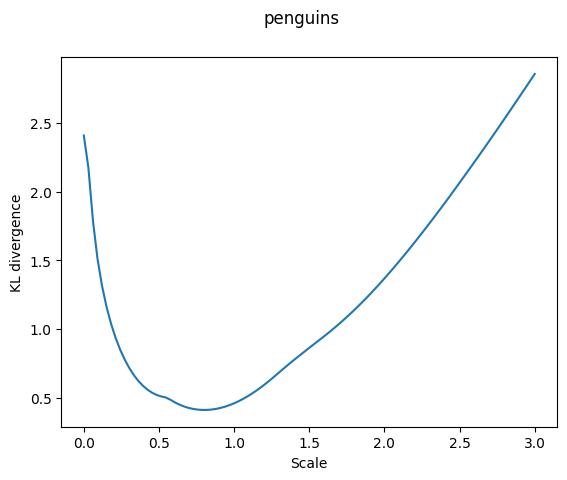

100%|██████████| 100/100 [00:11<00:00,  8.63it/s]


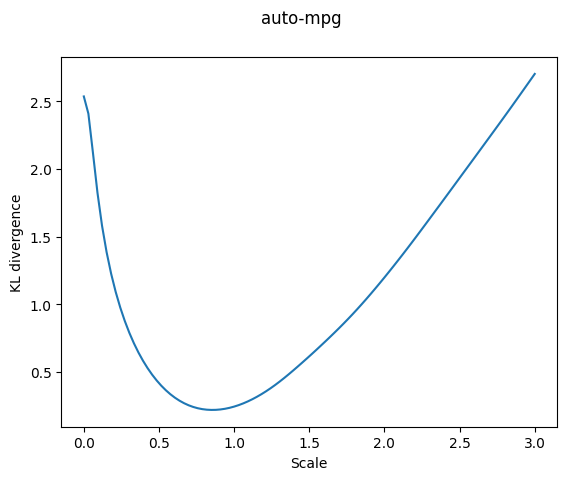

100%|██████████| 100/100 [00:06<00:00, 14.44it/s]


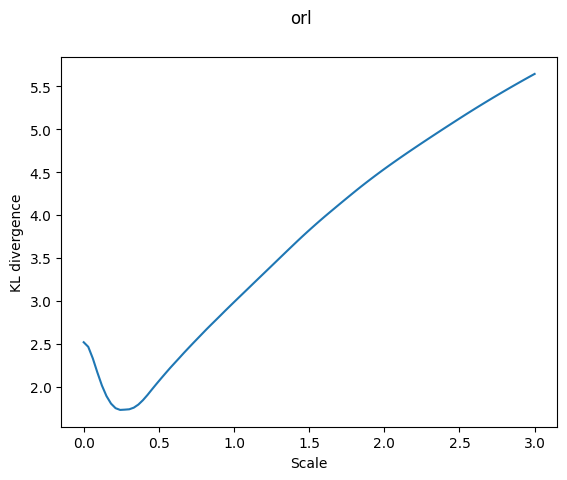

100%|██████████| 100/100 [00:18<00:00,  5.28it/s]


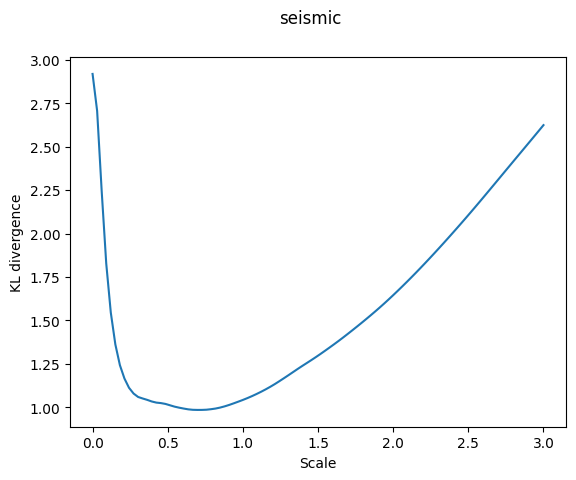

100%|██████████| 100/100 [00:22<00:00,  4.39it/s]


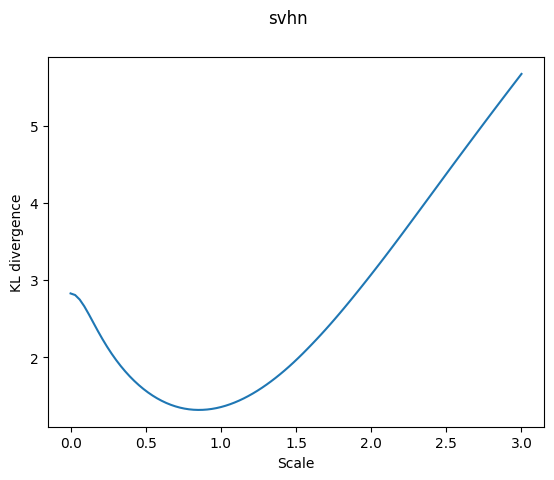

100%|██████████| 100/100 [00:23<00:00,  4.24it/s]


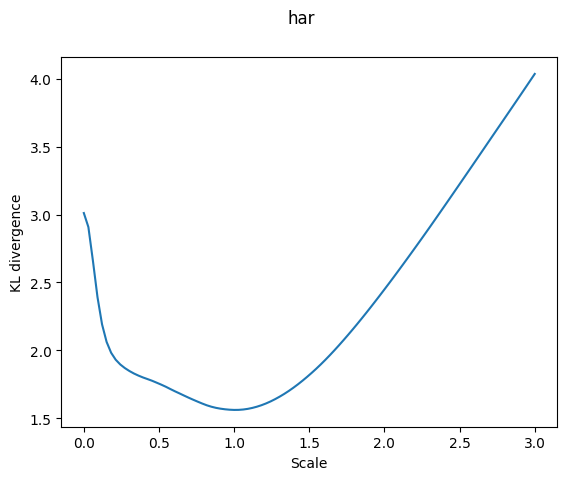

100%|██████████| 100/100 [01:33<00:00,  1.06it/s]


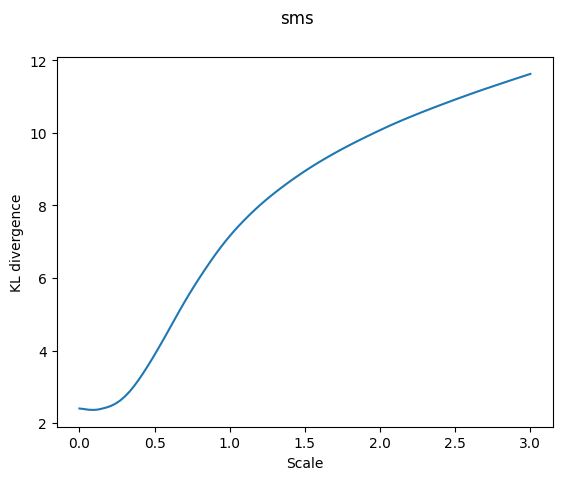

100%|██████████| 100/100 [00:42<00:00,  2.37it/s]


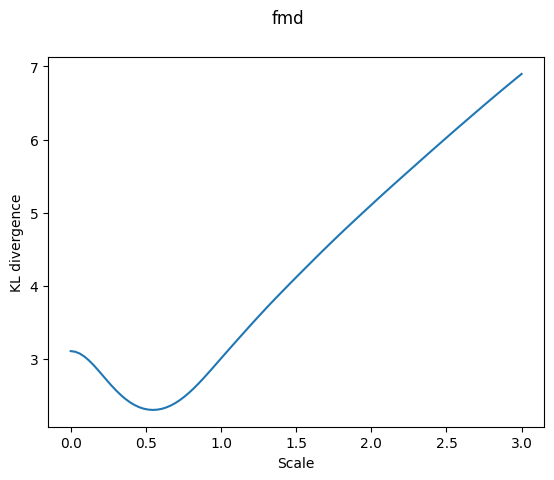

100%|██████████| 100/100 [00:47<00:00,  2.11it/s]


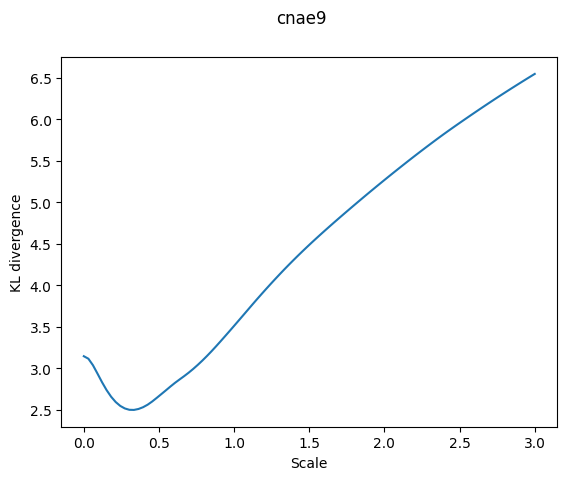

100%|██████████| 100/100 [01:12<00:00,  1.37it/s]


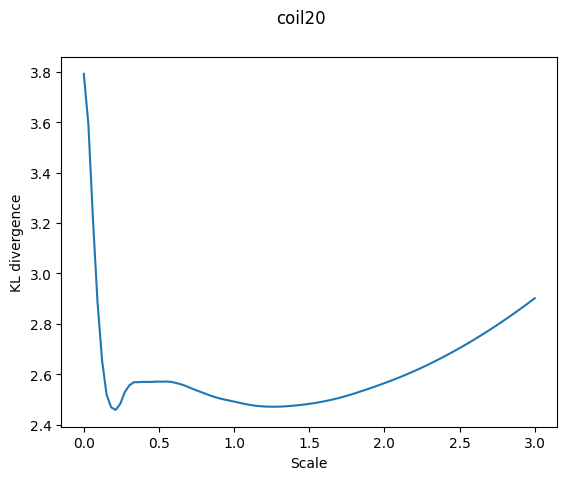

In [ ]:
for dataset in datasets:
    scales = np.linspace(0, 3, 100)
    X = np.load(DATASET_DIR / f"{dataset}.npy")
    Y = UMAP(random_state=42, n_jobs=1).fit_transform(X)

    kl_values = list()
    for alpha in tqdm(scales):
        M = Metrics(X, Y * alpha, setbatch=False)
        kl_value = M.compute_kl_divergence(perplexity=30, y_similarity='normal')
        kl_values.append(kl_value)

    import matplotlib.pyplot as plt

    fig, ax = plt.subplots()

    ax.plot(scales, kl_values)
    ax.set_xlabel("Scale")
    ax.set_ylabel("KL divergence")
    
    fig.suptitle(dataset)
    plt.show()
    

## KL asymptote from above

In [ ]:
import numpy as np
from sklearn.metrics import pairwise_distances

P = np.array([
    [0, 0.2, 0.1],
    [0.2, 0, 0.2],
    [0.1, 0.2, 0]
])
P = np.maximum(P, 1e-15)

Y = np.array([
    [0, 0],
    [0, 1],
    [1, 1]
])

def get_Q(Y):
    dY = pairwise_distances(Y)
    Q = (np.square(dY) + 1.0) ** -1
    np.fill_diagonal(Q, 0)
    Q /= Q.sum()
    Q = np.maximum(Q, 1e-15)
    return Q

scales = np.linspace(0, 15, 100)

kl_values = list()

for scale in scales:
    Q = get_Q(Y * scale)
    kl_divergence = (P * np.log(P / Q)).sum()
    kl_values.append(kl_divergence)

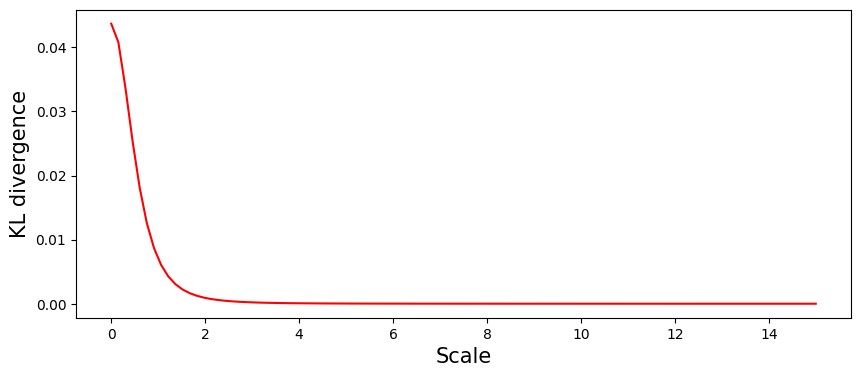

In [ ]:
fig, ax = plt.subplots(figsize=(10,4))
ax.plot(scales, kl_values, c='red')
ax.set_xlabel("Scale", size=15)
ax.set_ylabel("KL divergence", size=15)

plt.show()
fig.savefig("figs/kl_asymptote_appendix.pdf")

## Plot KL and NS curves for all datasets

In [ ]:
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt

* Set `metric = "KL"` for KL curves, and `metric = "NS"` for Normalized Stress curves
* The first run is chosen. To display for different runs, set variable run to the desired run (e.g. `run = "2"`).

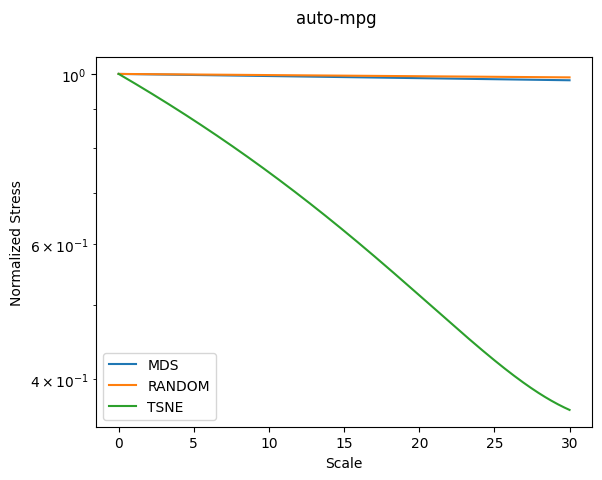

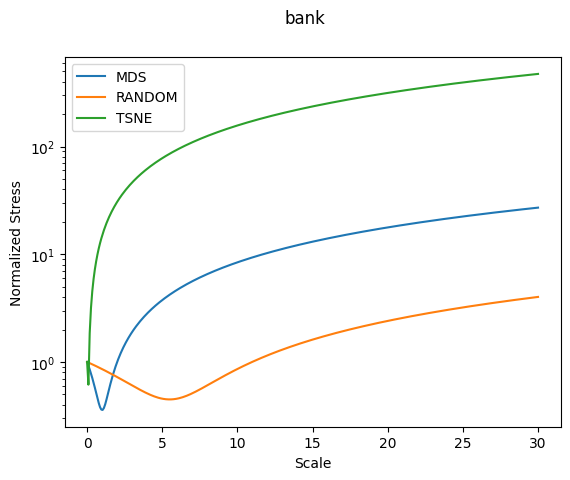

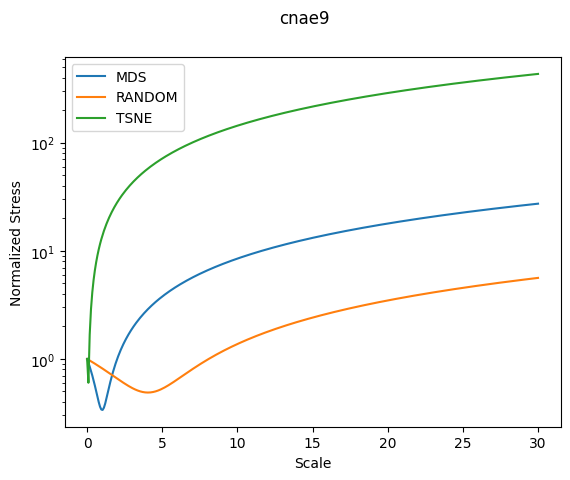

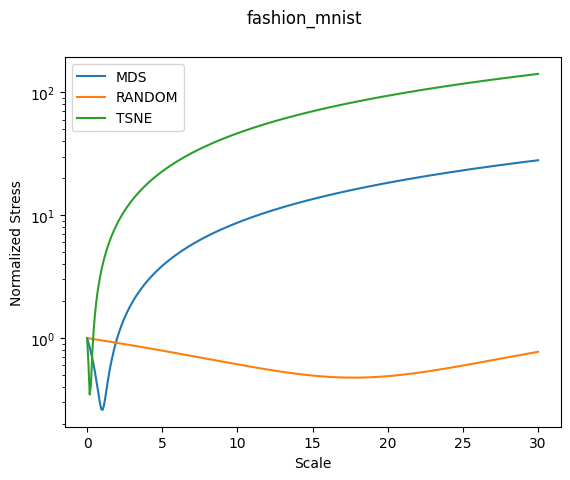

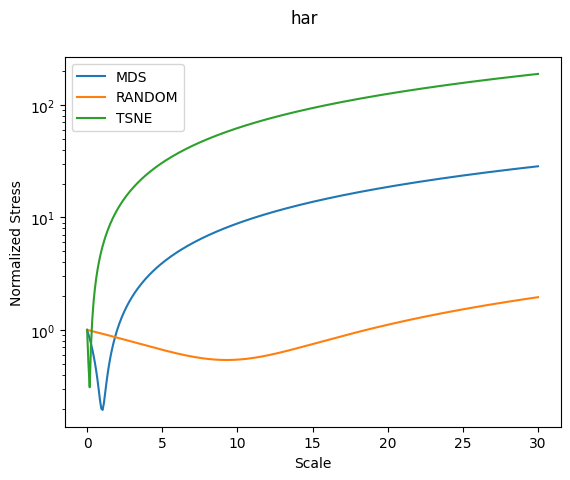

...

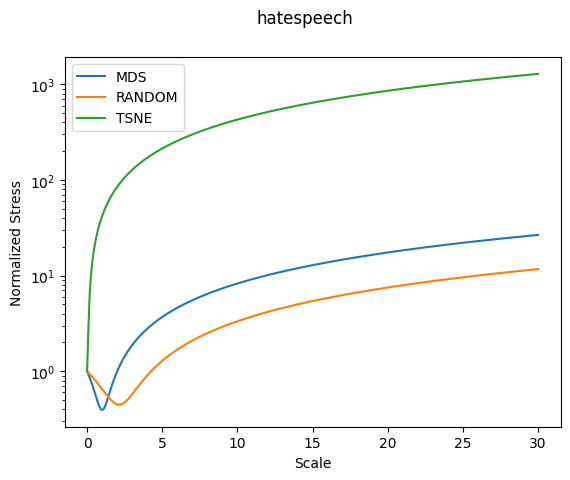

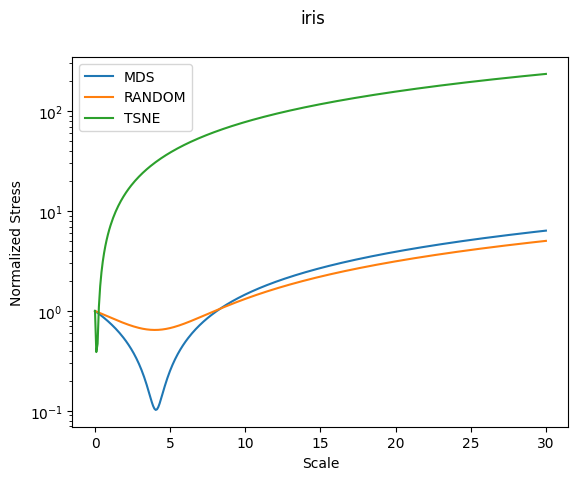

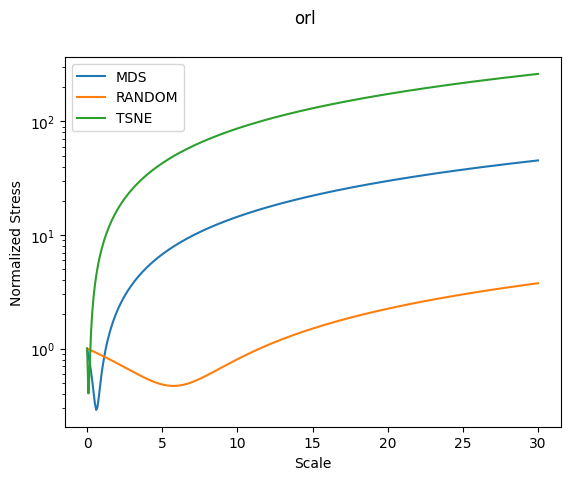

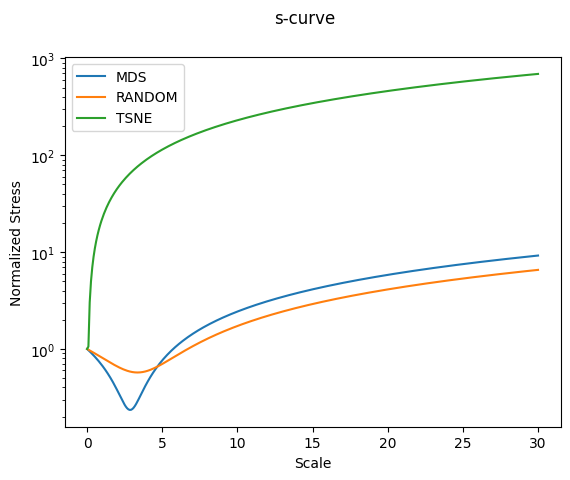

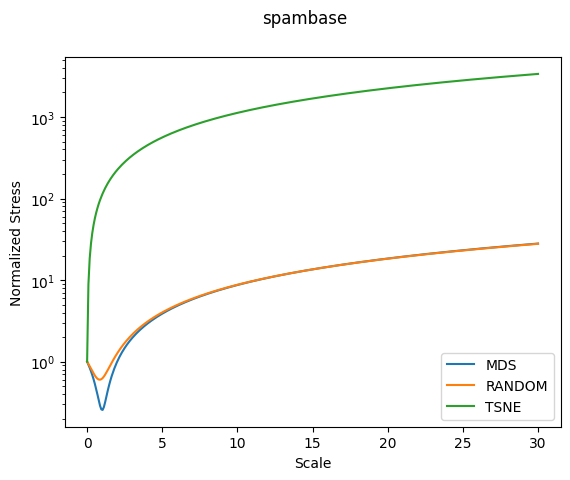

In [ ]:
CURVE_DIR = Path("curve_coords")

run = "0"
metric = "NS"

for dset_folder in CURVE_DIR.iterdir():
    dataset_name = dset_folder.stem

    fig, ax = plt.subplots()

    for alg_folder in (dset_folder / run).iterdir():
        alg_name = alg_folder.stem
        if alg_name == 'UMAP':
            continue
        scales = np.load(alg_folder / metric / "scales.npy")
        values = np.load(alg_folder / metric / "values.npy")

        ax.plot(scales, values, label=alg_name)
        if metric == "NS":
            ax.set_yscale('log')

        ax.set_xlabel("Scale")
        ax.set_ylabel("KL divergence" if metric=='KL' else "Normalized Stress")
   
    ax.legend()

    fig.suptitle(dataset_name)
    plt.show()

## Plot embeddings

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

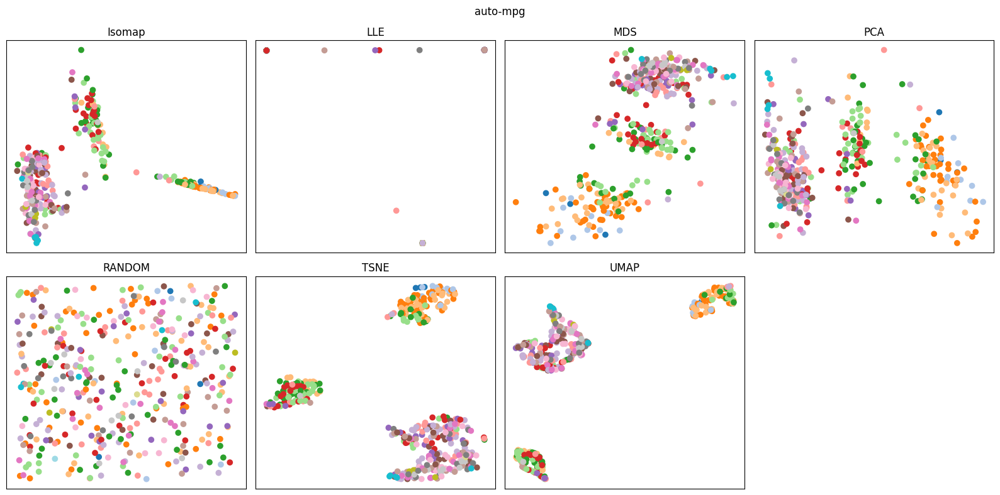

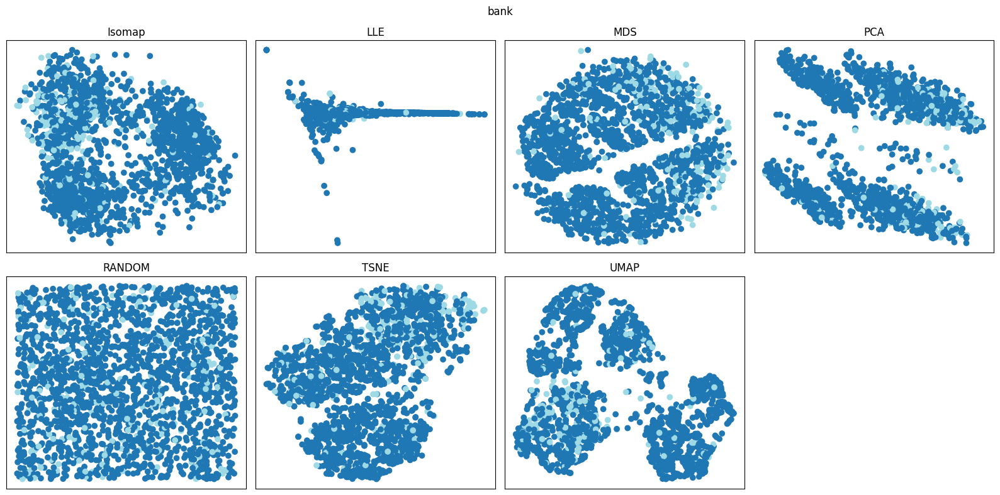

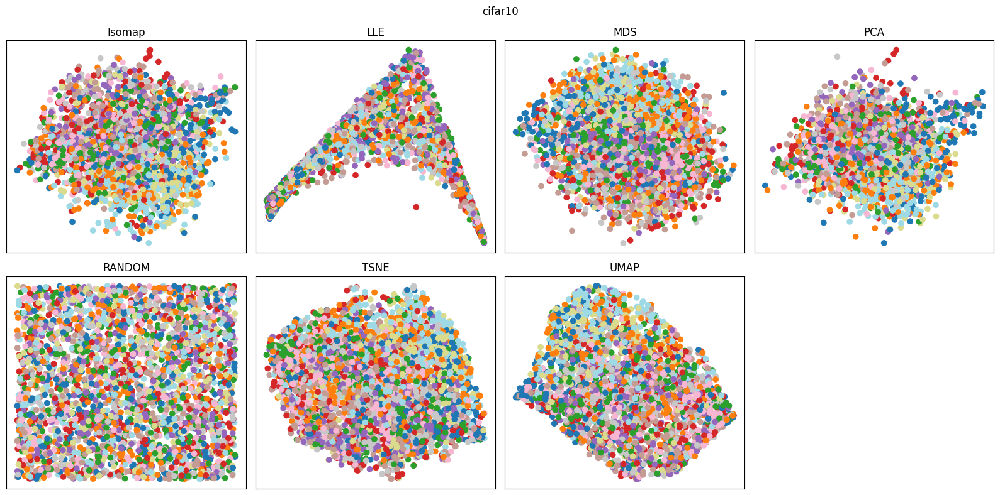

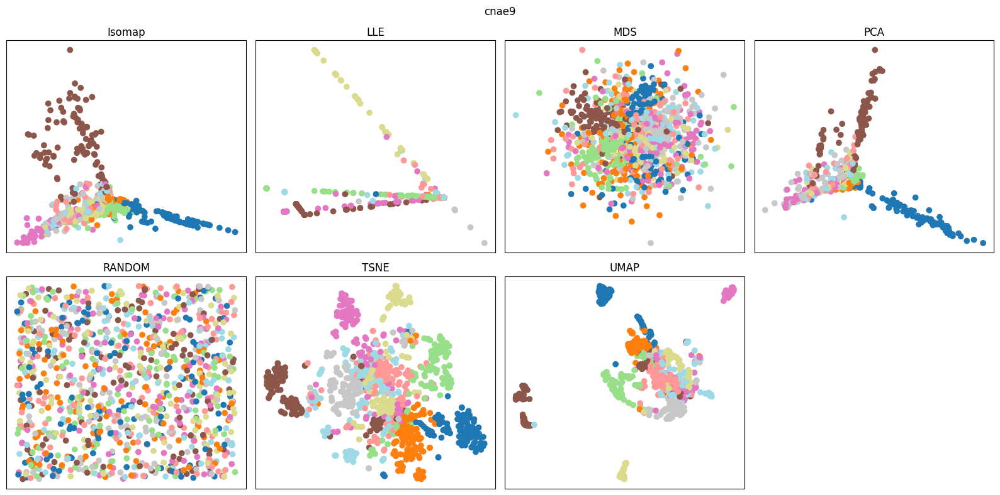

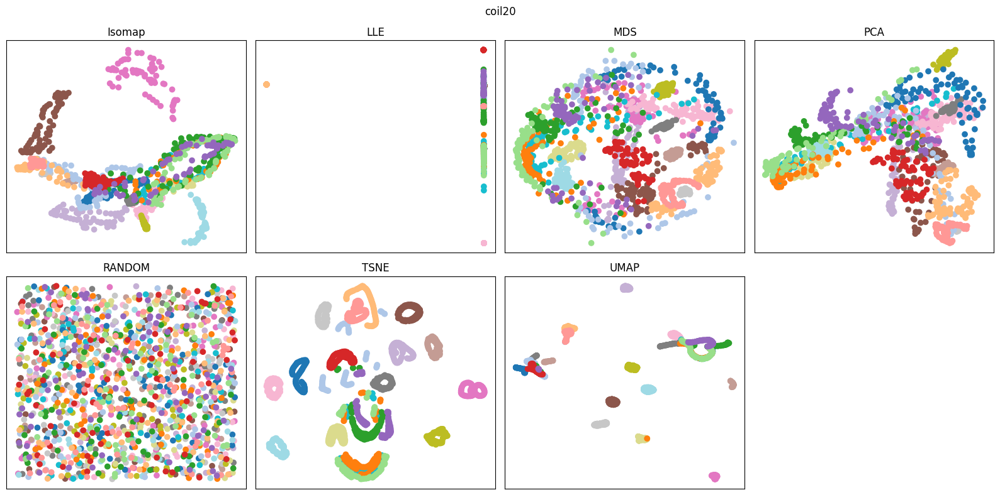

...

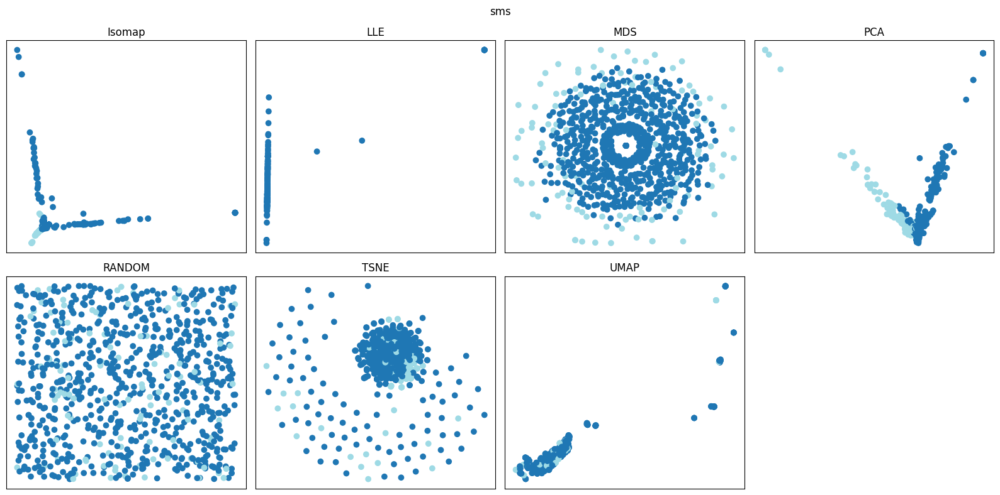

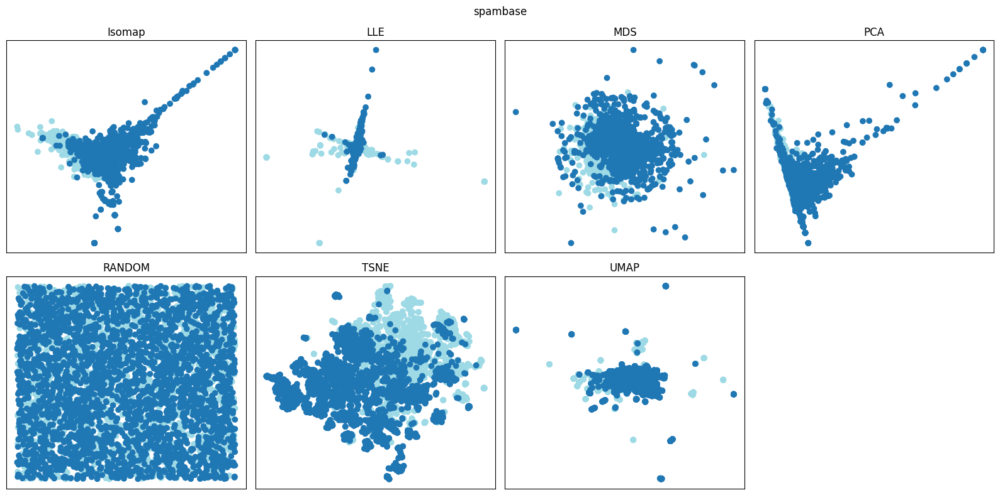

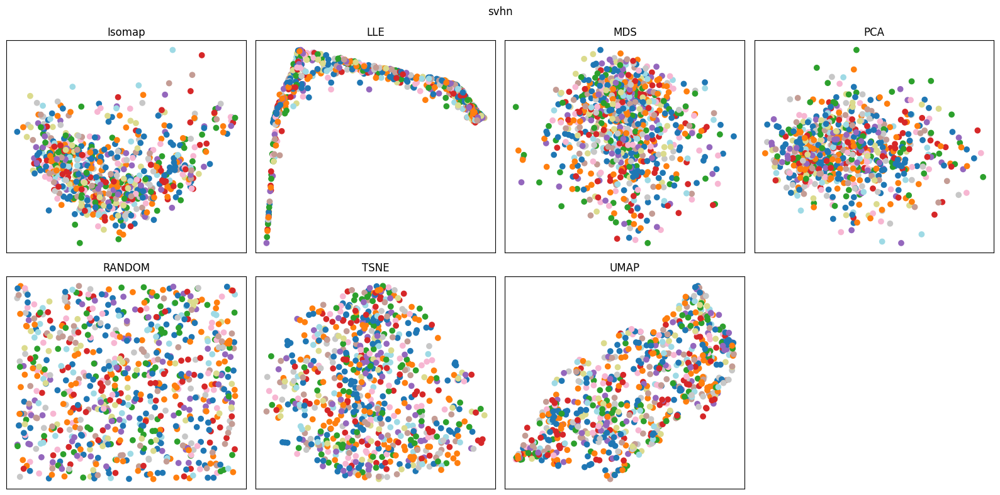

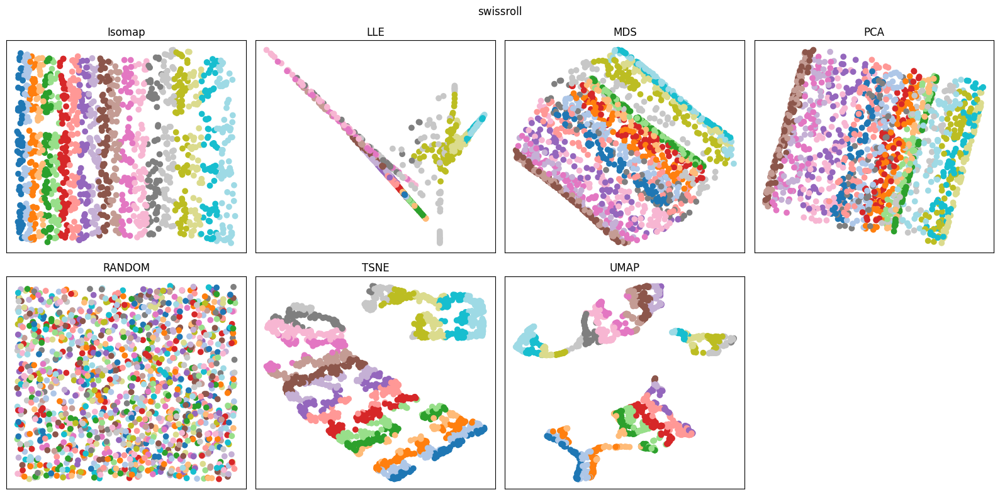

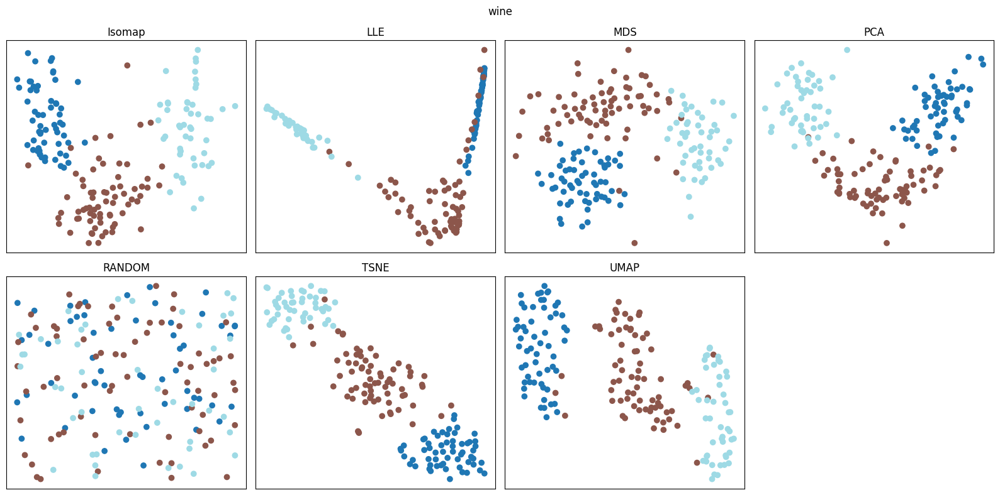

In [ ]:
LABELS_DIR = Path("dataset_labels")
EMBEDDINGS_DIR = Path("embeddings")
run = "0"

for f in LABELS_DIR.iterdir():
    labels = np.load(f)
    dataset_name = f.stem

    embs = dict()
    for embfile in EMBEDDINGS_DIR.iterdir():
        if embfile.stem.startswith(dataset_name) and embfile.stem.endswith(run):
            alg_name = embfile.name.replace(f"{dataset_name}_", "").replace(f"_{run}.npy", "")
            embs[alg_name] = np.load(embfile)
    
    ax_len = 4
    ncols = 4
    nrows = len(embs) // ncols + 1
    fig, axes = plt.subplots(nrows, ncols, figsize=(ax_len * ncols, ax_len * nrows))
    axes = axes.flatten()
    for ax, (alg_name, emb) in zip(axes, embs.items()):
        ax.scatter(*emb.T, c=labels, cmap='tab20')
        ax.set_title(alg_name)
        ax.set_xticks([])
        ax.set_yticks([])
    for ax in axes[len(embs):]:
        ax.remove()

    fig.suptitle(dataset_name)
    plt.tight_layout(pad=1.1)
    plt.show()